In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import decoupler as dc
import anndata as ad
import numpy as np

### Loading and processing df

In [2]:
gsea_path = '../../data/tf_gsea/gsea_results.csv'
with open(gsea_path) as file:
    df_gsea = pd.read_csv(file, index_col=0)
    
outputs_path = '../../extdata/PRISM_19Q4/secondary-screen-dose-response-curve-parameters.csv'
with open(outputs_path) as file:
    df_outputs = pd.read_csv(file)

counts_path = '../../data/prism_processed/counts_matched_prism.csv'
with open(counts_path) as file:
    df_counts = pd.read_csv(file, index_col=0)
    
metadata_path = '../../data/prism_processed/metadata_ccle_prism.csv'
with open(metadata_path) as file:
    df_metadata = pd.read_csv(file, index_col=0)
    
net_path  = '../../data/prism_processed/drug_net_prism.csv'
with open(net_path) as file:
    drug_net = pd.read_csv(file, index_col=0)

/var/folders/rb/pxdy_9ms1y9_0mz_htpjk4980000gn/T/ipykernel_14476/1847194173.py:3: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  df_gsea = pd.read_csv(file, index_col=0)
/var/folders/rb/pxdy_9ms1y9_0mz_htpjk4980000gn/T/ipykernel_14476/1847194173.py:7: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  df_outputs = pd.read_csv(file)


In [25]:
tf_net = dc.get_collectri(organism='human', split_complexes=False)
adata = ad.AnnData(X=df_counts.values, obs=pd.DataFrame(index=df_counts.index), var=pd.DataFrame(index=df_counts.columns))
dc.run_ulm(
    mat=adata,
    net=tf_net,
    source='source',
    target='target',
    weight='weight',
    verbose=True,
    use_raw = False,
    batch_size=10000, 
    min_n=5
)

df_tf = adata.obsm['ulm_estimate']
df_outputs = df_outputs[df_outputs['depmap_id'].isin(df_counts.index)]
df_outputs['screen_id'] = pd.Categorical(df_outputs['screen_id'], categories=["MTS010", "MTS006", "MTS005", "HTS002"], ordered=True)
df_outputs_sorted_sorted = df_outputs.sort_values(by='screen_id')

seen_broad_ids = set()
result_rows = []

# Filter by screen id
for screen_id in ["MTS010", "MTS006", "MTS005", "HTS002"]:

    current_level = df_outputs_sorted_sorted[df_outputs_sorted_sorted['screen_id'] == screen_id]
    new_broad_ids = current_level[~current_level['broad_id'].isin(seen_broad_ids)]
    seen_broad_ids.update(new_broad_ids['broad_id'])
    result_rows.append(new_broad_ids)

df_outputs_filtered = pd.concat(result_rows, ignore_index=True)

df_metadata['OncotreePrimaryDisease'] = df_metadata['OncotreePrimaryDisease'].str.replace(' ', '_', regex=True).replace('/', '_', regex=True)
df_metadata['OncotreeLineage'] = df_metadata['OncotreeLineage'].str.replace(' ', '_', regex=True).replace('/', '_', regex=True)

/var/folders/rb/pxdy_9ms1y9_0mz_htpjk4980000gn/T/ipykernel_14476/1159352919.py:2: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = ad.AnnData(X=df_counts.values, obs=pd.DataFrame(index=df_counts.index), var=pd.DataFrame(index=df_counts.columns))


6 features of mat are empty, they will be removed.
Running ulm on mat with 476 samples and 19187 targets for 771 sources.


### Results with all cell-lines

In [107]:
# Select a moa:
moa = 'EGFR inhibitor'
#moa = 'PPAR receptor agonist'

# Select a threshold:
gsea_value = 0.9

df_sugsea = df_gsea[df_gsea['MoA']== moa]
df_sugsea = df_sugsea[df_sugsea['Tumor type'] == 'All cell lines']
df_sugsea = df_sugsea[np.abs(df_sugsea['GSEA value'])>gsea_value]
tf_selected = df_sugsea['TF'].to_list()
df_selected_tf = df_tf[tf_selected] 
print(f"Number of TF selected: {len(tf_selected)}")

Number of TF selected: 12


#### PLOT 1: Heatmaps of TF activity with cells grouped by AUC quartiles

In [6]:
# Select the number of quartiles
number_quartiles = 4

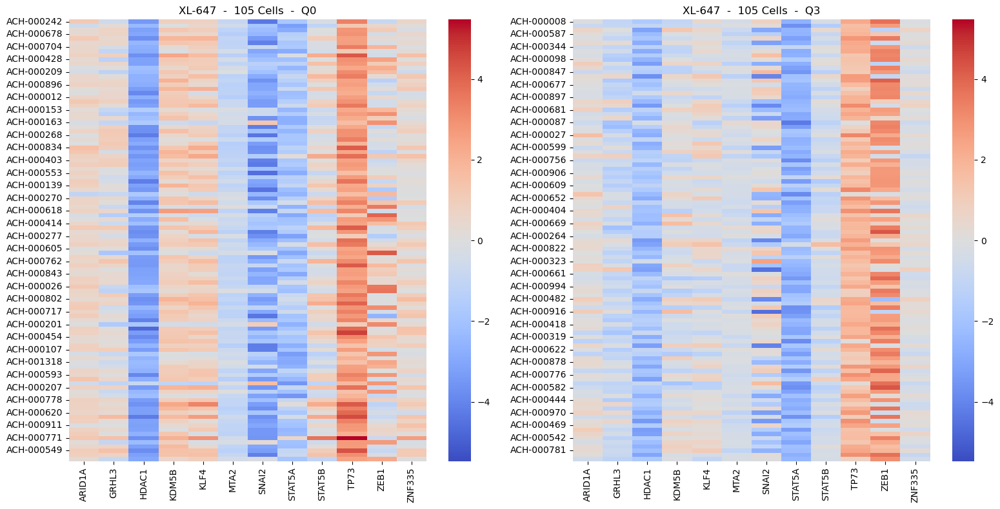

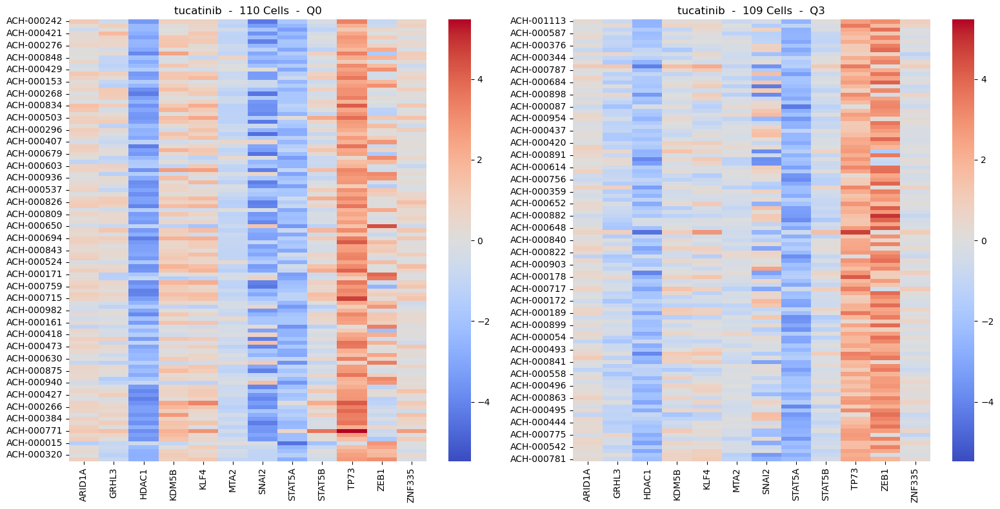

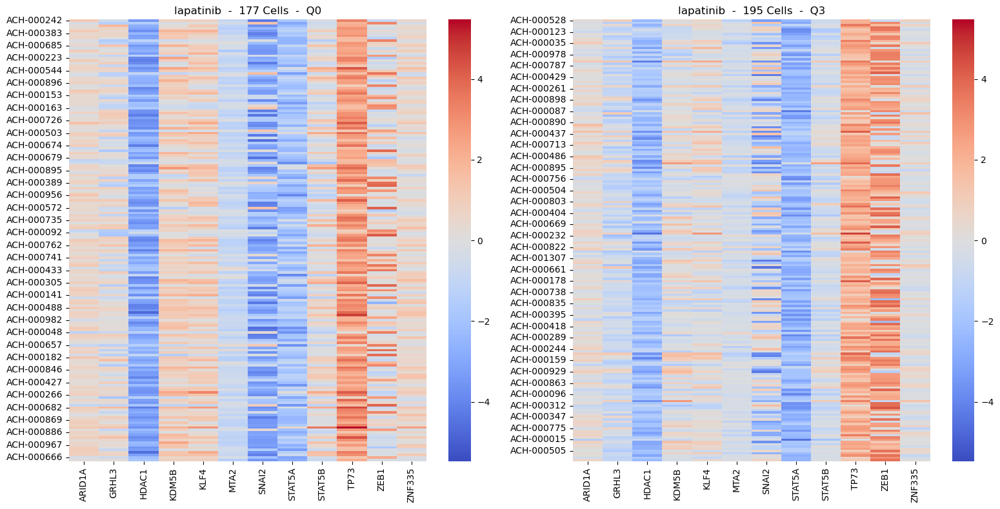

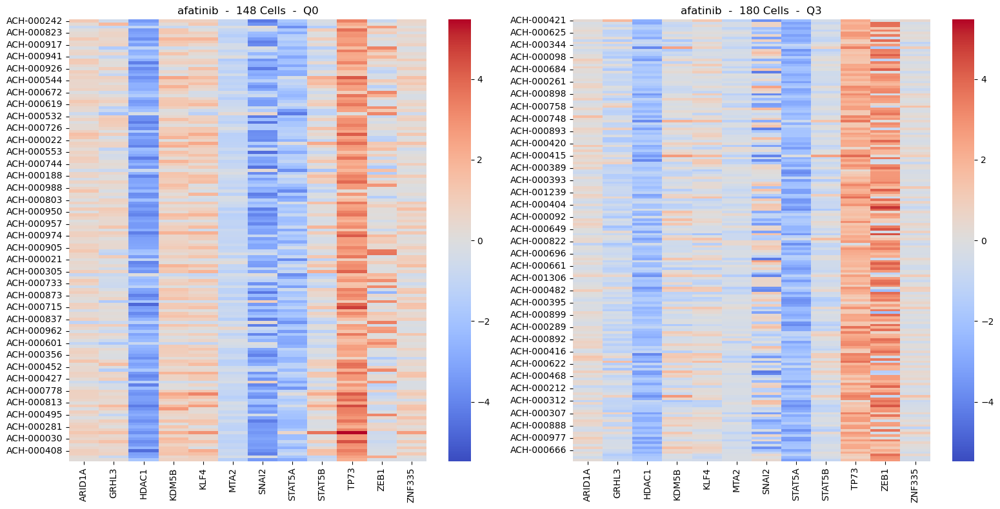

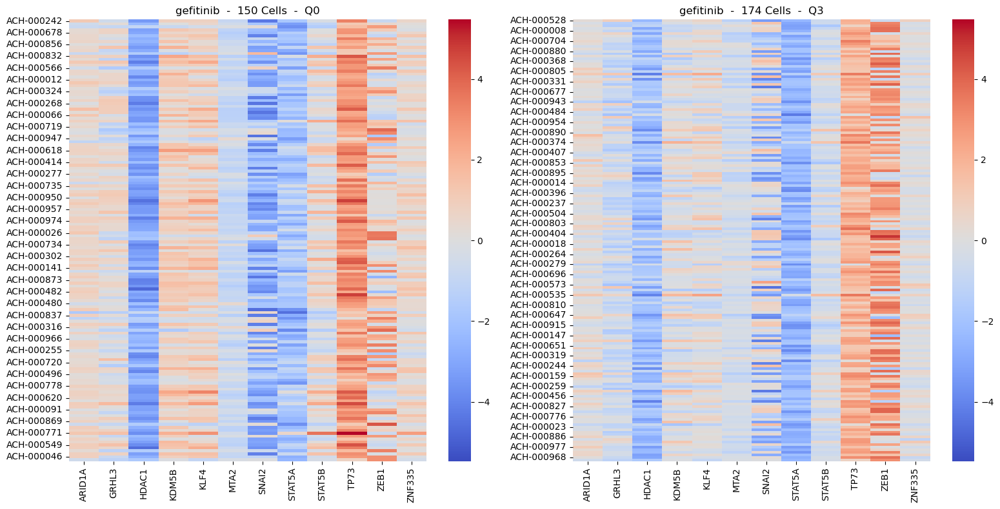

...

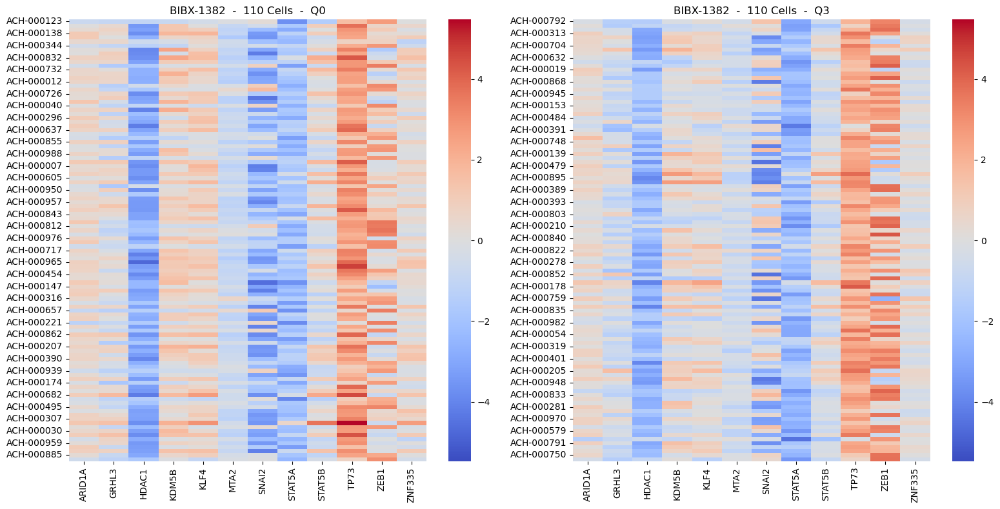

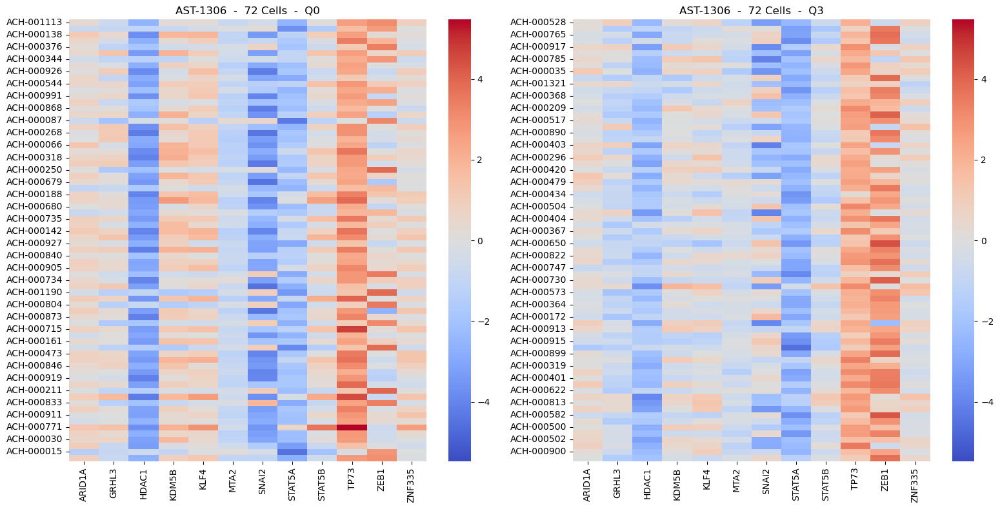

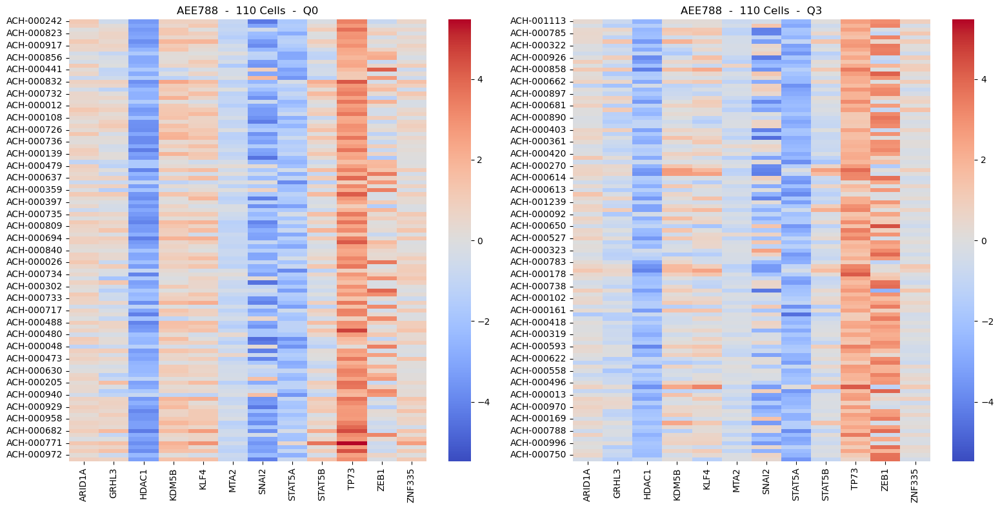

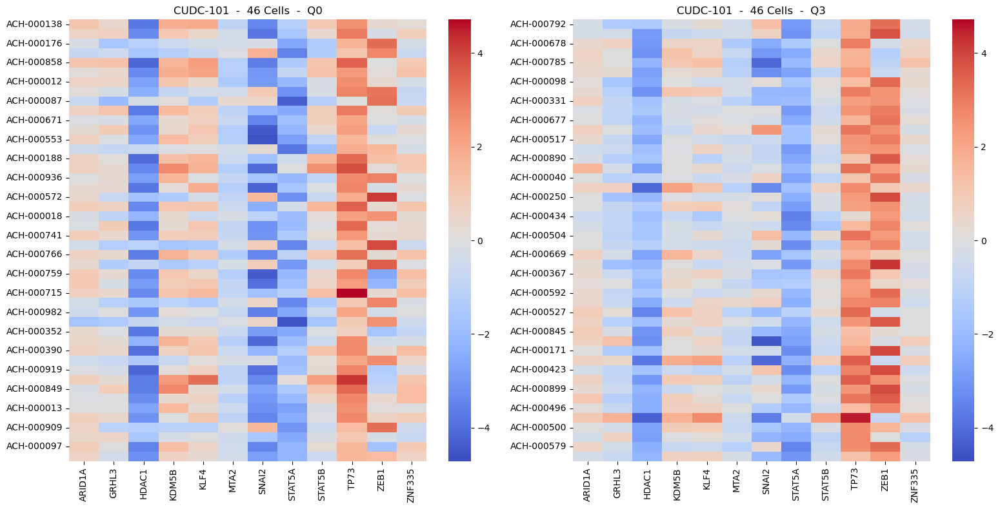

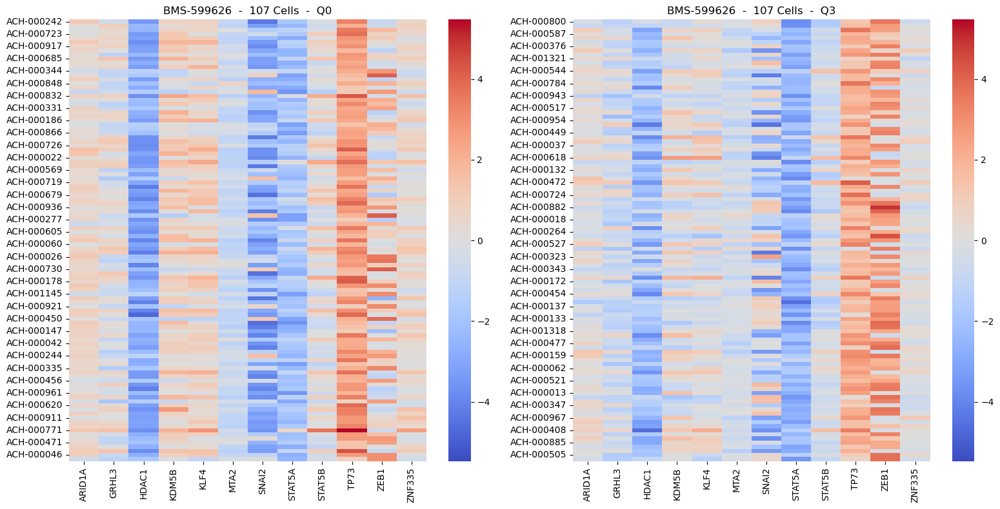

In [7]:
for drug in drug_net['name'][drug_net['moa']==moa].unique():
    sub = df_outputs_filtered[df_outputs_filtered['name']==drug]
    sub = sub.copy()
    try:
        sub['cuartil'] = pd.qcut(sub['auc'], number_quartiles, labels=False)    
        cells_1 = df_selected_tf[df_selected_tf.index.isin(sub['depmap_id'][sub['cuartil']==0])]
        cells_2 = df_selected_tf[df_selected_tf.index.isin(sub['depmap_id'][sub['cuartil']==(number_quartiles-1)])]
        
        vmin = min(cells_1.min().min(), cells_2.min().min())
        vmax = max(cells_1.max().max(), cells_2.max().max())
        vfinal = max(np.abs(vmin), vmax)
        # Crear una figura con dos subplots (1 fila, 2 columnas)
        fig, axes = plt.subplots(1, 2, figsize=(16, 8))

        # Heatmap para el primer dataset con las mismas escalas
        sns.heatmap(cells_1, cmap='coolwarm', vmin=-vfinal, vmax=vfinal, ax=axes[0])
        axes[0].set_title(f'{drug}  -  {len(cells_1)} Cells  -  Q0')

        # Heatmap para el segundo dataset con las mismas escalas
        sns.heatmap(cells_2, cmap='coolwarm', vmin=-vfinal, vmax=vfinal, ax=axes[1])
        axes[1].set_title(f'{drug}  -  {len(cells_2)} Cells  -  Q{(number_quartiles-1)}')

        # Ajustar la figura para que no haya superposición
        plt.tight_layout()

        # Mostrar el gráfico
        plt.show()
    except Exception:
        continue

#### PLOT 2: Boxplots of auc values with cells grouped by the activity of 1 TF 

In [8]:
# Select a TF:
tf_of_interest = 'ARID1A'

# Select number of quartiles:
number_quartiles = 4

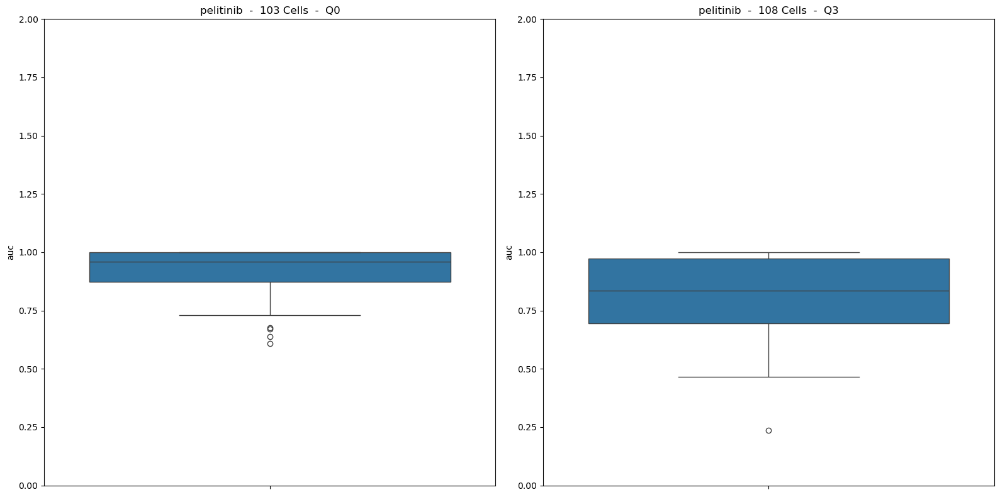

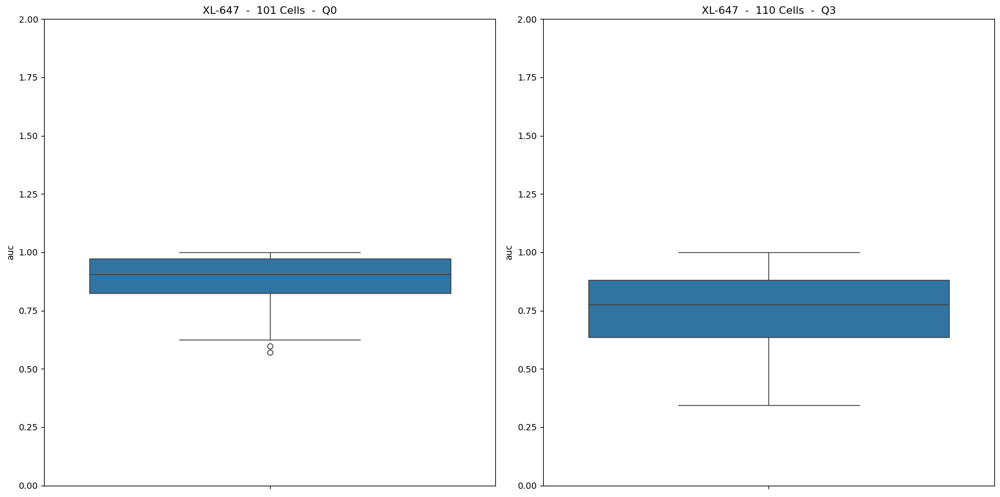

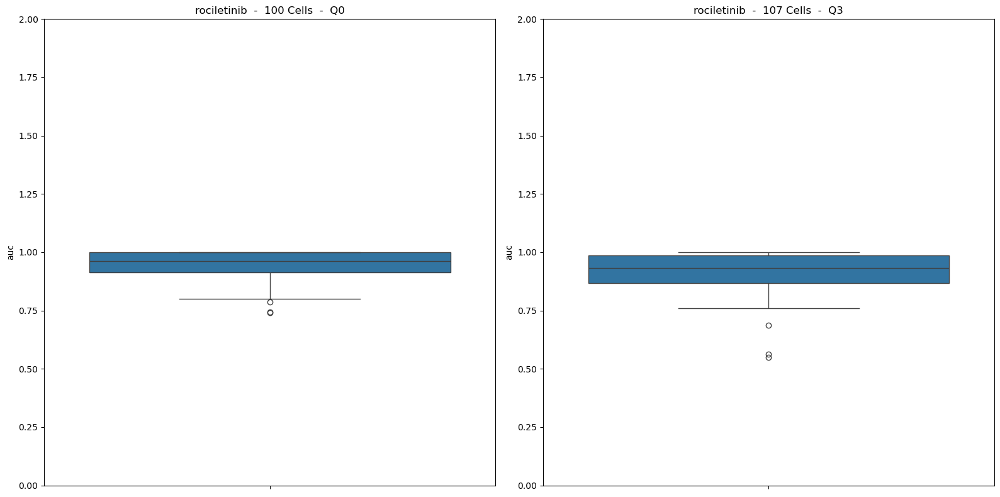

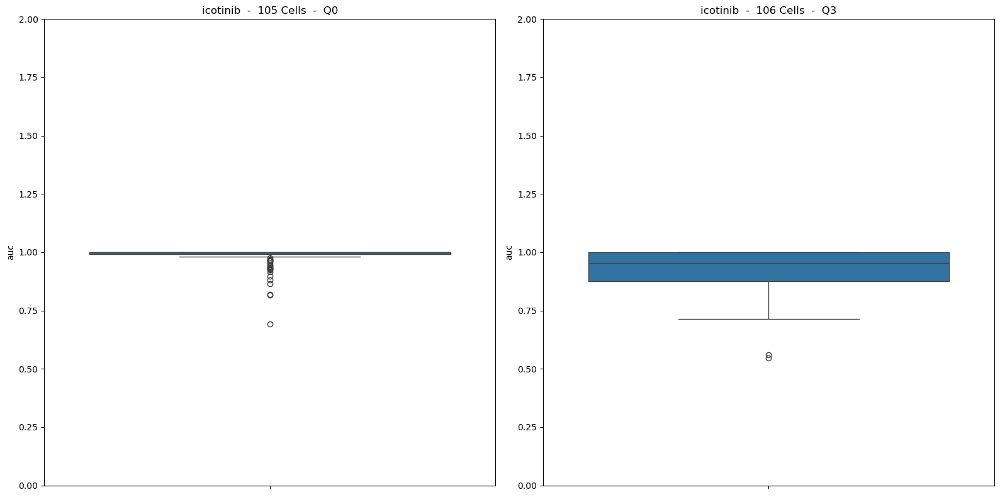

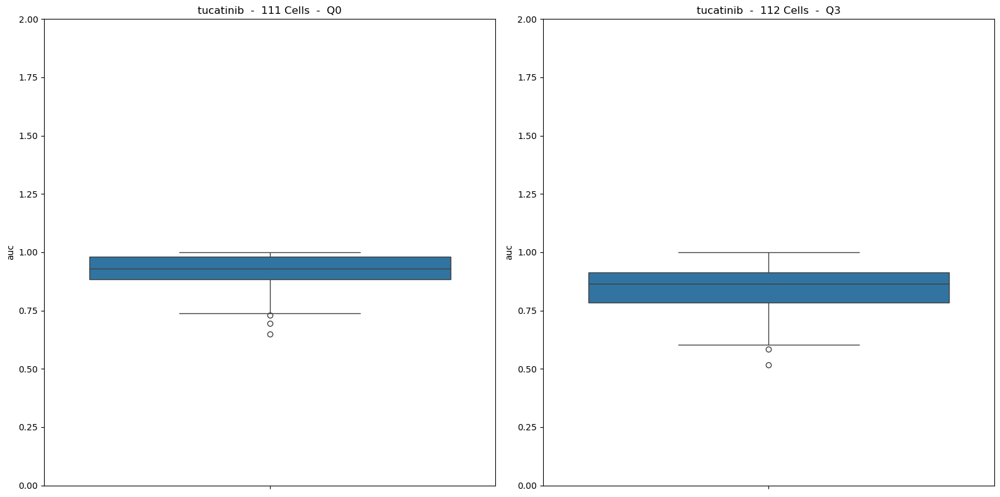

...

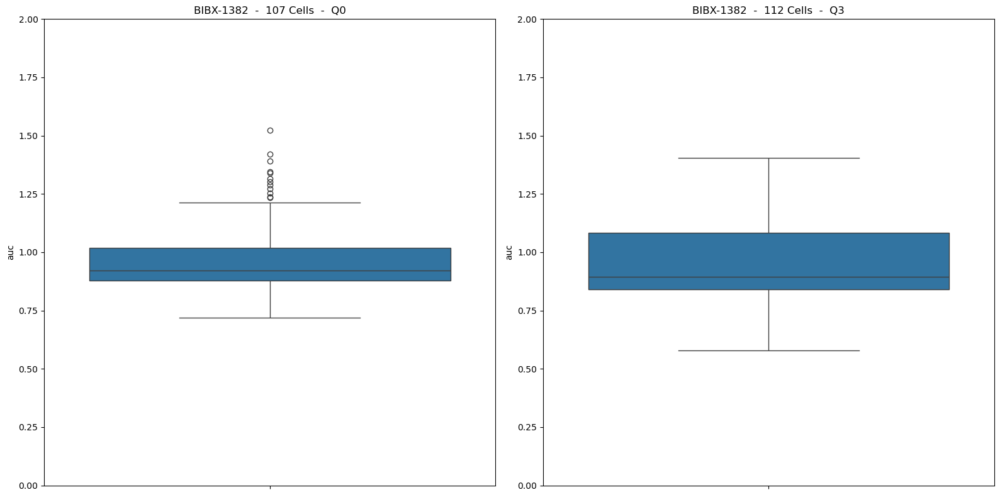

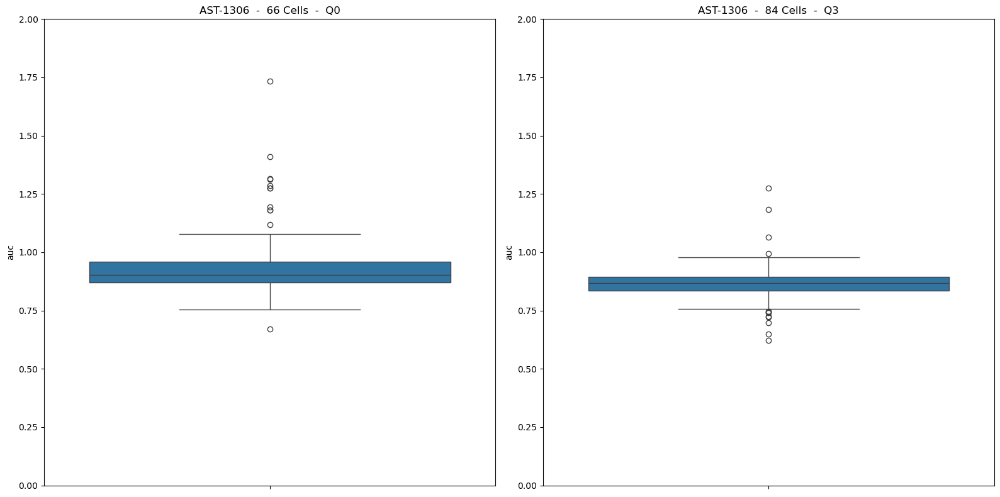

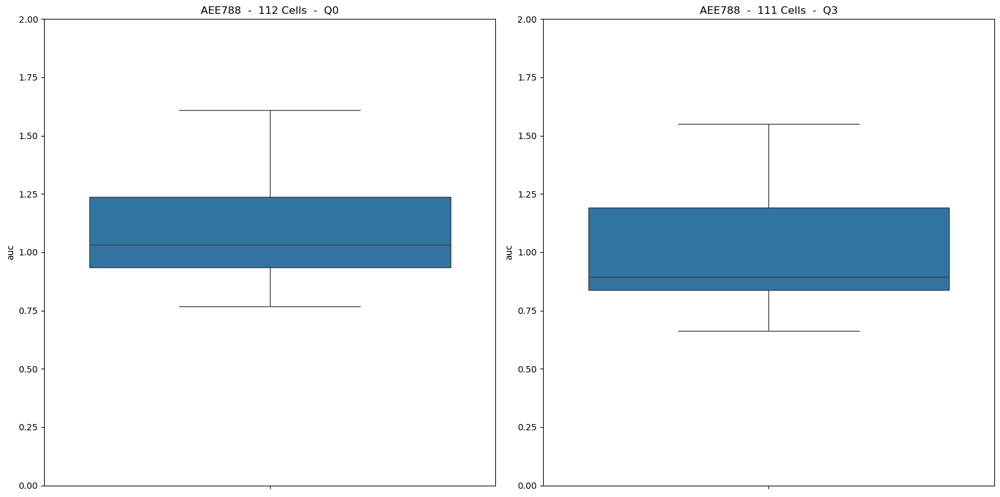

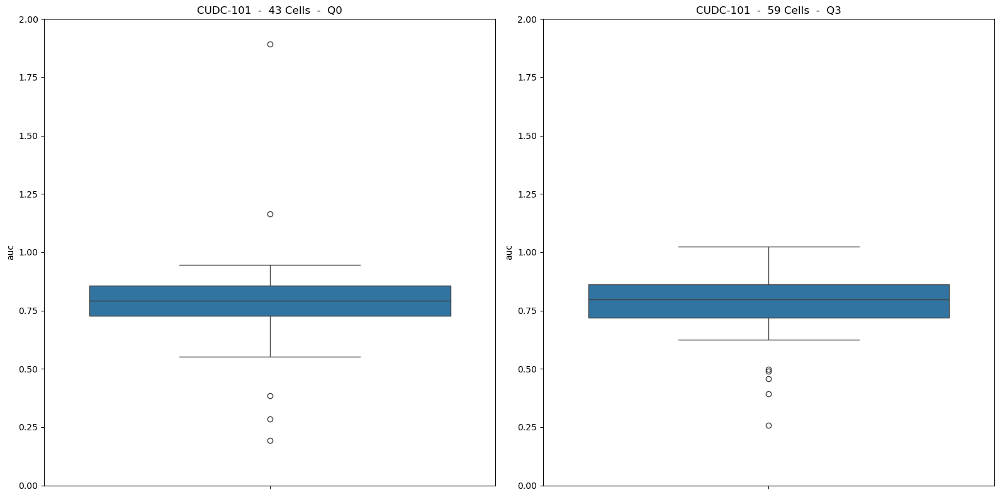

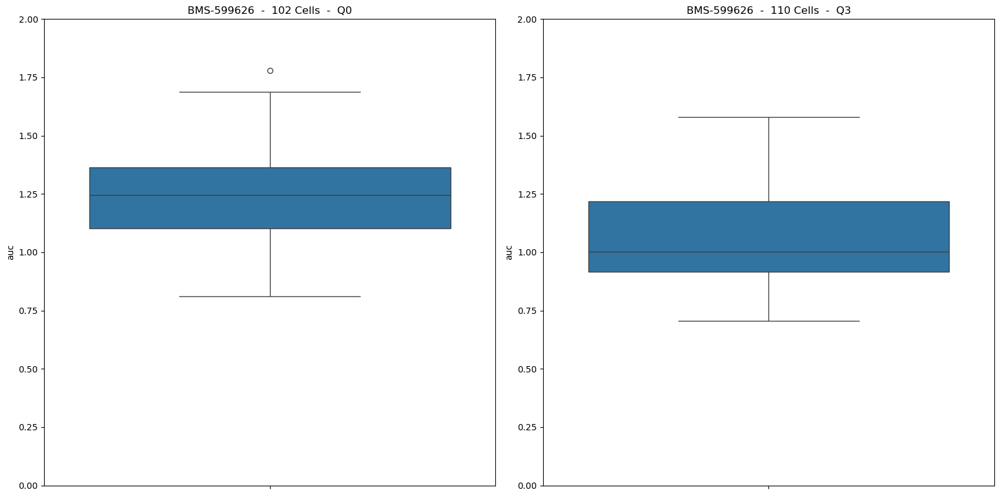

In [9]:
for drug in drug_net['name'][drug_net['moa']==moa].unique():
    try:
        sub = df_outputs_filtered[df_outputs_filtered['name'] == drug]
        sub = sub.copy()
        
        df_sub_tf = df_tf.copy()
        df_sub_tf['cuartil'] = pd.qcut(df_sub_tf[tf_of_interest], number_quartiles, labels=False)
   
        
        cells_1 = df_sub_tf[df_sub_tf['cuartil'] == 0]
        cells_2 = df_sub_tf[df_sub_tf['cuartil'] == (number_quartiles-1)]
        auc_1 = sub['auc'][sub['depmap_id'].isin(cells_1.index)]
        auc_2 = sub['auc'][sub['depmap_id'].isin(cells_2.index)]

        fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
        sns.boxplot(data=auc_1, ax=axes[0])
        axes[0].set_ylim(0, 2)
        axes[0].set_title(f'{drug}  -  {len(auc_1)} Cells  -  Q0')

        # Boxplot para el segundo grupo (cells_2)
        sns.boxplot(data=auc_2, ax=axes[1])
        axes[1].set_ylim(0, 2)
        axes[1].set_title(f'{drug}  -  {len(auc_2)} Cells  -  Q{(number_quartiles-1)}')

        # Ajustar la figura para que no haya superposición
        plt.tight_layout()

        # Mostrar el gráfico
        plt.show()
            
    except Exception:
        continue

###  Results splited by tumor type

In [ ]:
# Avalible groups in gsea results: 

#       'All cell lines', 'Bowel', 'Skin', 'Bladder_Urinary_Tract', 'Lung',
#       'Ovary_Fallopian_Tube', 'Breast', 'Pancreas', 'CNS_Brain',
#       'Kidney', 'Bone', 'Head_and_Neck', 'Uterus', 'Liver',
#       'Esophagus_Stomach', 'Colorectal_Adenocarcinoma', 'Melanoma',
#       'Bladder_Urothelial_Carcinoma', 'Non-Small_Cell_Lung_Cancer',
#       'Ovarian_Epithelial_Tumor', 'Invasive_Breast_Carcinoma',
#       'Pancreatic_Adenocarcinoma', 'Diffuse_Glioma',
#       'Renal_Cell_Carcinoma', 'Head_and_Neck_Squamous_Cell_Carcinoma',
#       'Endometrial_Carcinoma', 'Hepatocellular_Carcinoma',
#       'Esophagogastric_Adenocarcinoma',
#       'Esophageal_Squamous_Cell_Carcinoma'

In [112]:
# Select a group
group = 'Lung'

# Select a lable
lable = 'OncotreeLineage'
# lable = 'OncotreePrimaryDisease'

# Select a moa
moa = 'EGFR inhibitor'
#moa = 'PPAR receptor agonist'

# Select a treshold
gsea_value = 0.75

df_sub_gsea = df_gsea[df_gsea['MoA']==moa]
df_sub_gsea = df_sub_gsea[df_sub_gsea['Tumor type'] == group]
df_sub_gsea = df_sub_gsea[df_sub_gsea['GSEA value'] > gsea_value]
print(f"Number of TF selected: {len(df_sub_gsea)}")
cell_lines = df_metadata.index[df_metadata[lable]==group].to_list()
print(f"Number of cell-lines: {len(cell_lines)}")

Number of TF selected: 13
Number of cell-lines: 92


#### PLOT 1: Heatmaps of TF activity with cells grouped by AUC quartiles

In [114]:
# Select the number of quartiles
number_quartiles = 3

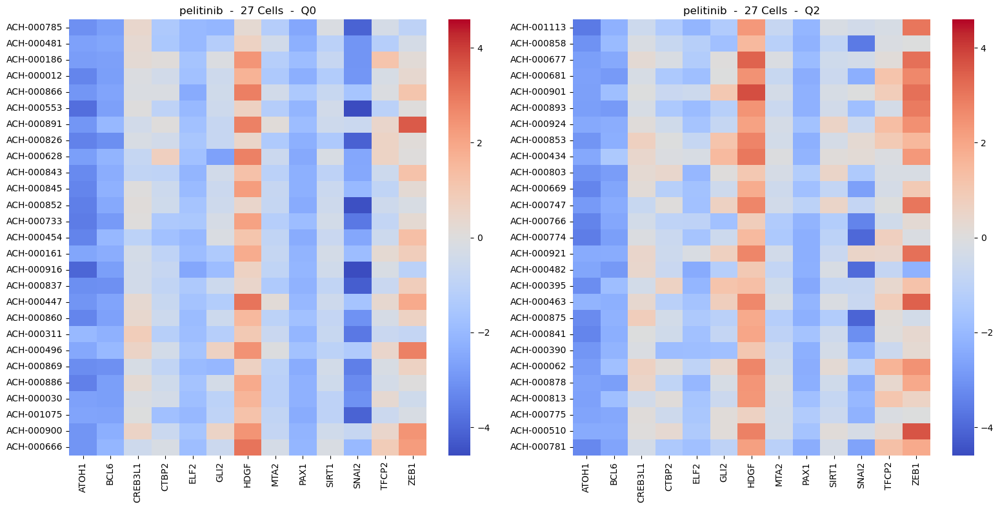

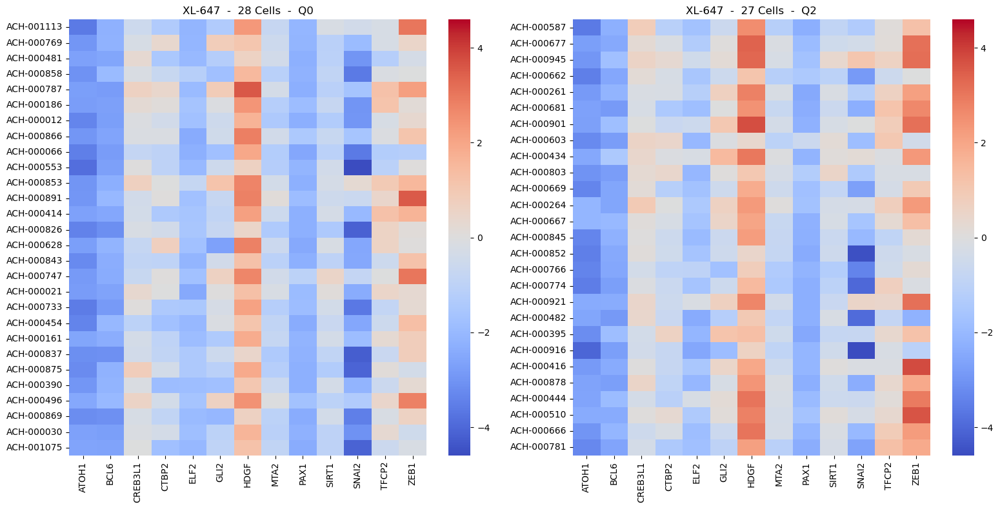

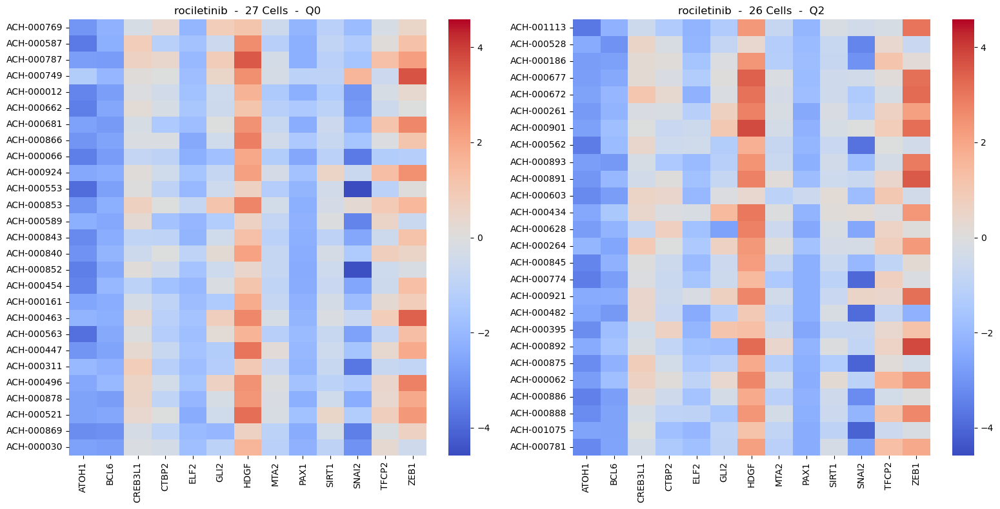

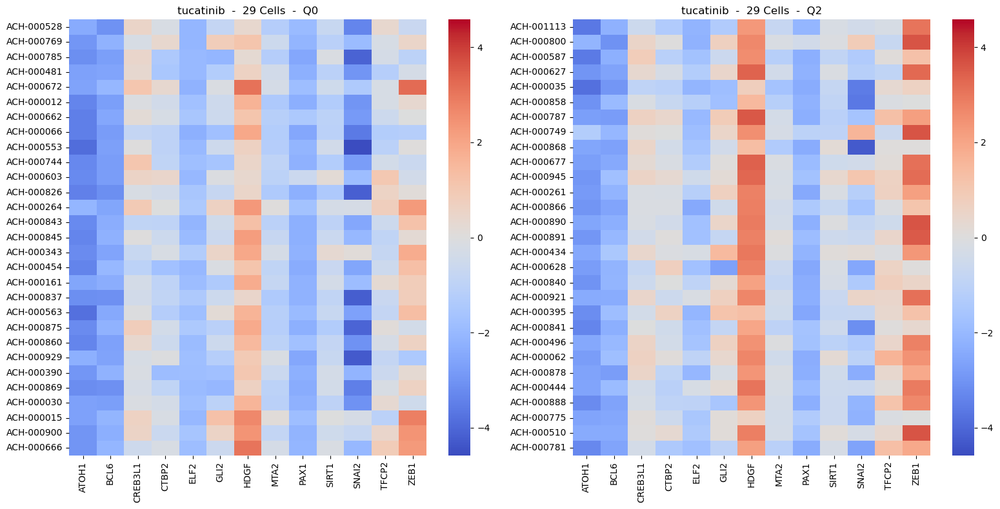

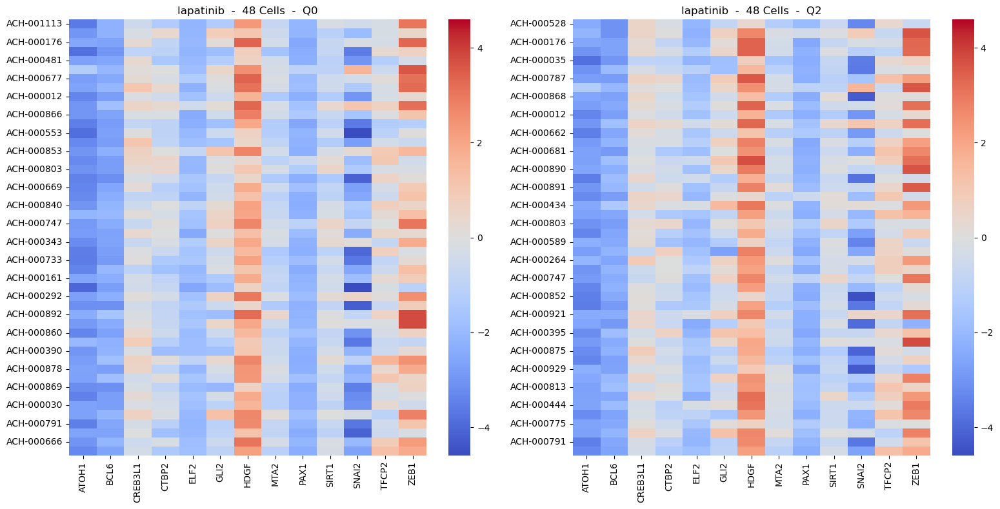

...

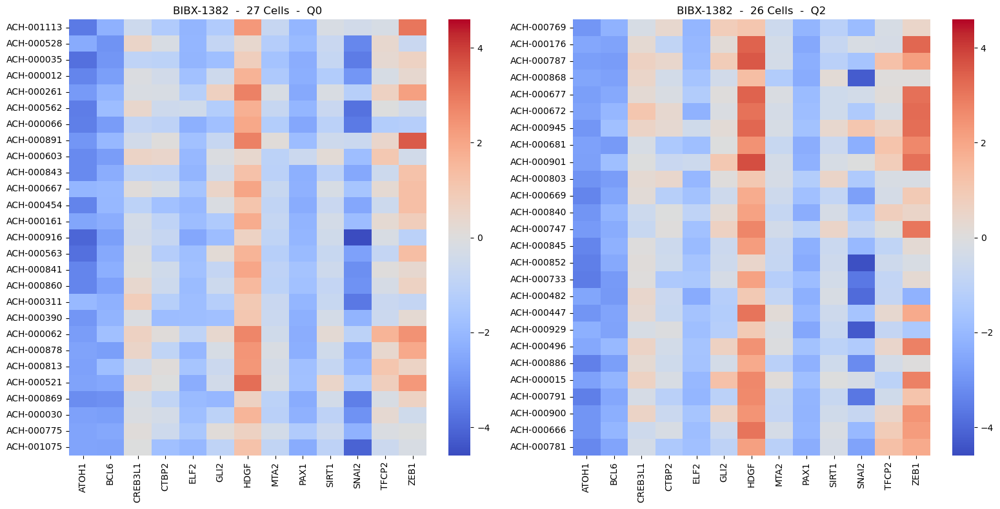

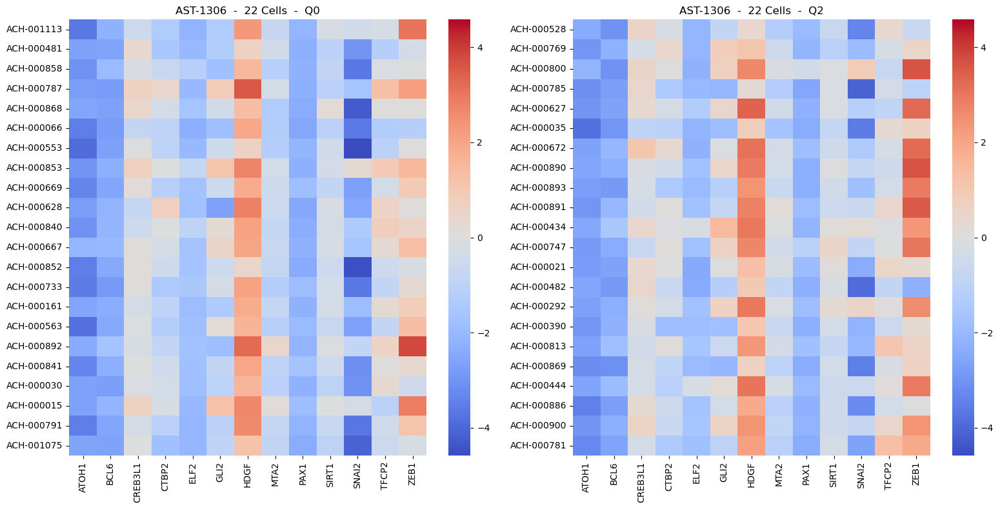

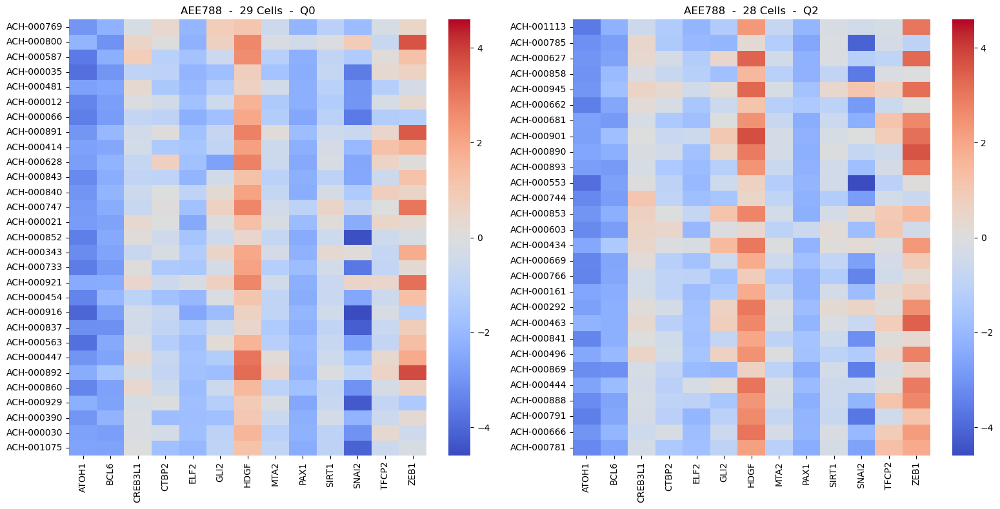

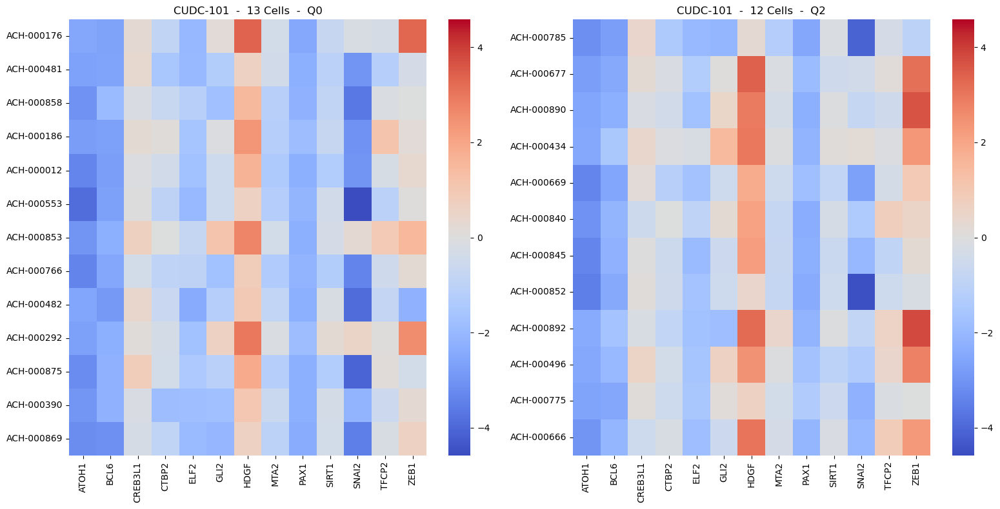

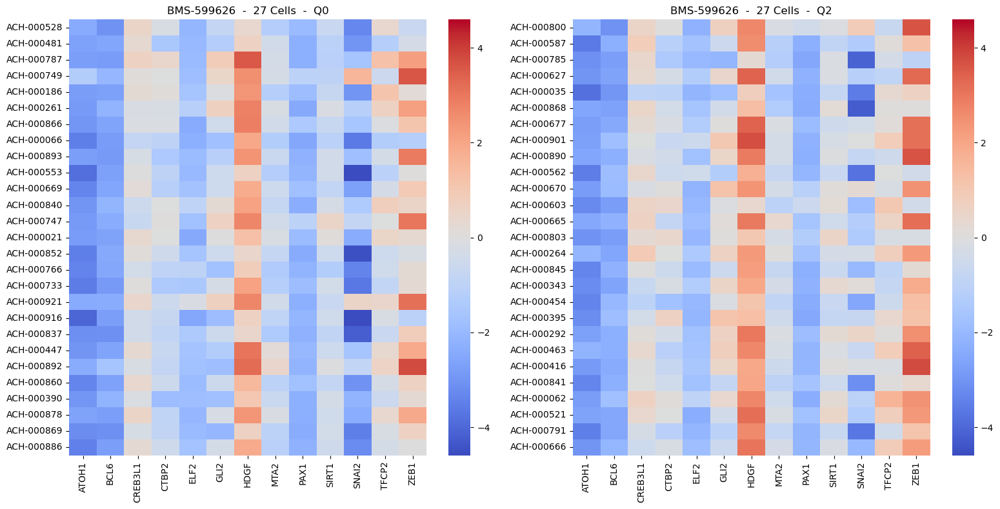

In [115]:
df_sub_counts = df_tf[df_tf.index.isin(cell_lines)]
df_sub_counts = df_sub_counts[df_sub_gsea['TF'].to_list()]
df_filtered_by_type = df_outputs_filtered[df_outputs_filtered['depmap_id'].isin(cell_lines)]

for drug in drug_net['name'][drug_net['moa']==moa].unique():
    sub = df_filtered_by_type[df_filtered_by_type['name']==drug]
    sub = sub.copy()
    try:
        sub['cuartil'] = pd.qcut(sub['auc'], number_quartiles, labels=False)    
        cells_1 = df_sub_counts[df_sub_counts.index.isin(sub['depmap_id'][sub['cuartil']==0])]
        cells_2 = df_sub_counts[df_sub_counts.index.isin(sub['depmap_id'][sub['cuartil']==(number_quartiles-1)])]
        
        vmin = min(cells_1.min().min(), cells_2.min().min())
        vmax = max(cells_1.max().max(), cells_2.max().max())
        vfinal = max(np.abs(vmin), vmax)
        # Crear una figura con dos subplots (1 fila, 2 columnas)
        fig, axes = plt.subplots(1, 2, figsize=(16, 8))

        # Heatmap para el primer dataset con las mismas escalas
        sns.heatmap(cells_1, cmap='coolwarm', vmin=-vfinal, vmax=vfinal, ax=axes[0])
        axes[0].set_title(f'{drug}  -  {len(cells_1)} Cells  -  Q0')

        # Heatmap para el segundo dataset con las mismas escalas
        sns.heatmap(cells_2, cmap='coolwarm', vmin=-vfinal, vmax=vfinal, ax=axes[1])
        axes[1].set_title(f'{drug}  -  {len(cells_2)} Cells  -  Q{(number_quartiles-1)}')

        # Ajustar la figura para que no haya superposición
        plt.tight_layout()

        # Mostrar el gráfico
        plt.show()
    except Exception:
        continue

#### PLOT 2: Boxplots of auc values with cells grouped by the activity of 1 TF 

In [116]:
# Select the number of quartiles
number_quartiles = 3

# TF of interest:
tf_of_interest = 'ZEB1'

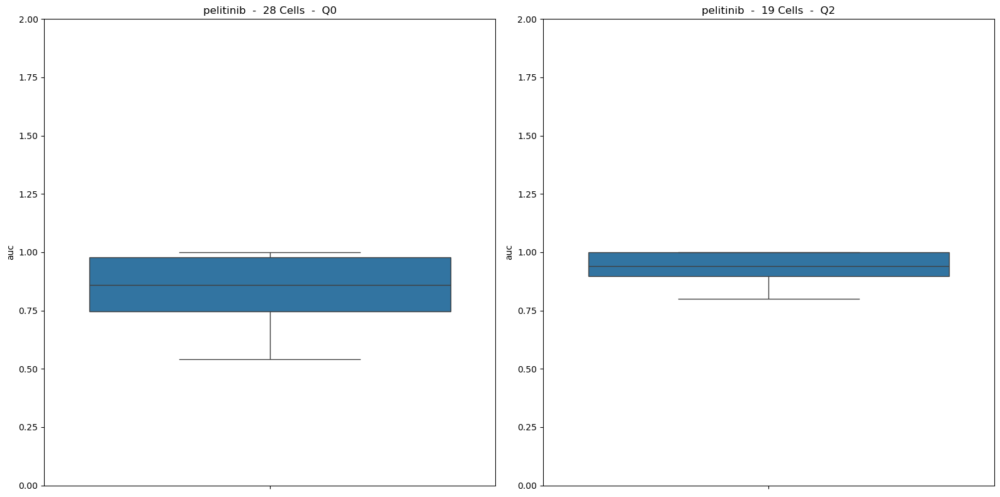

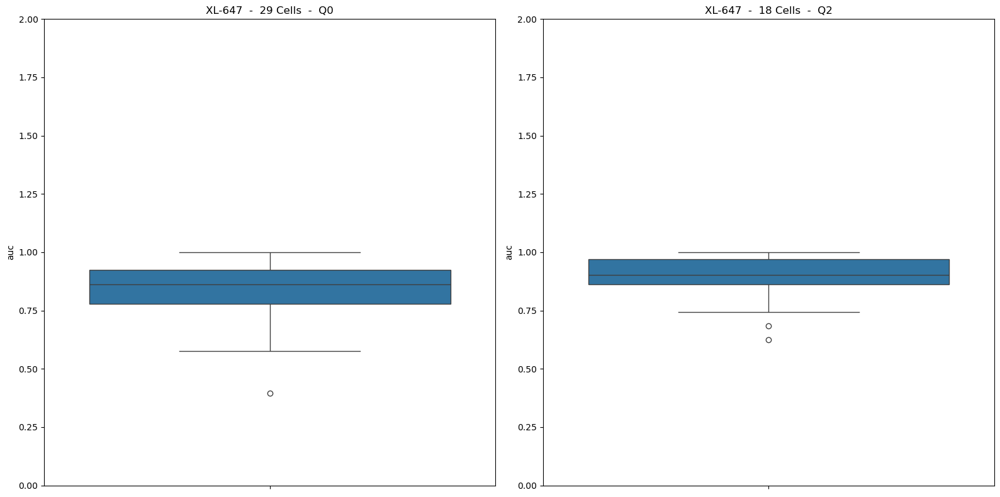

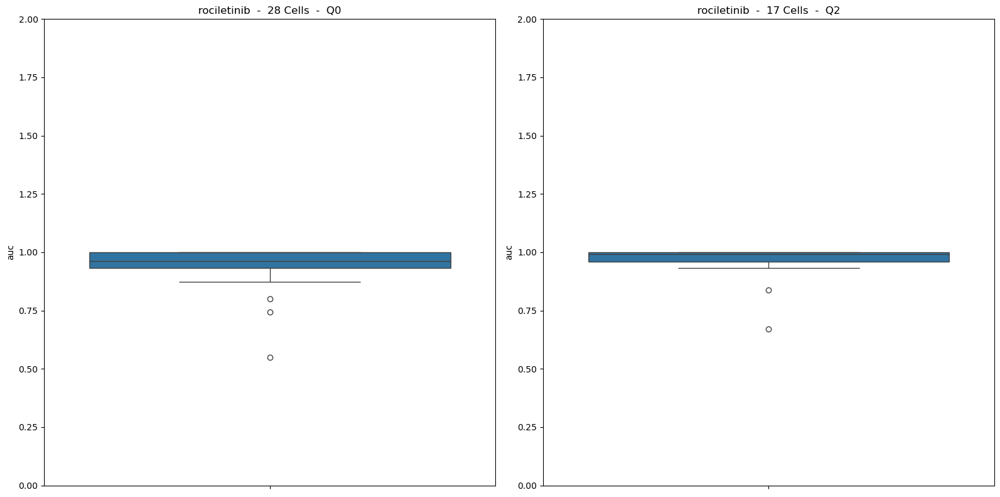

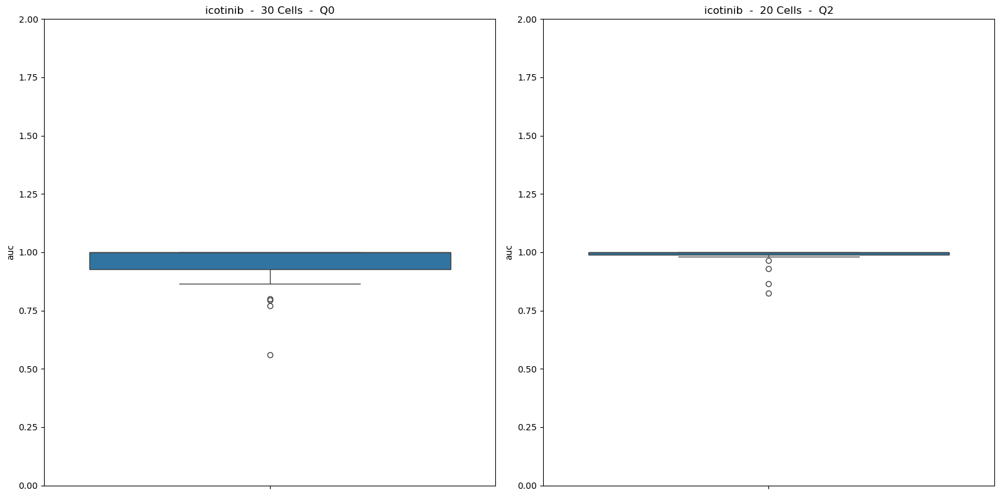

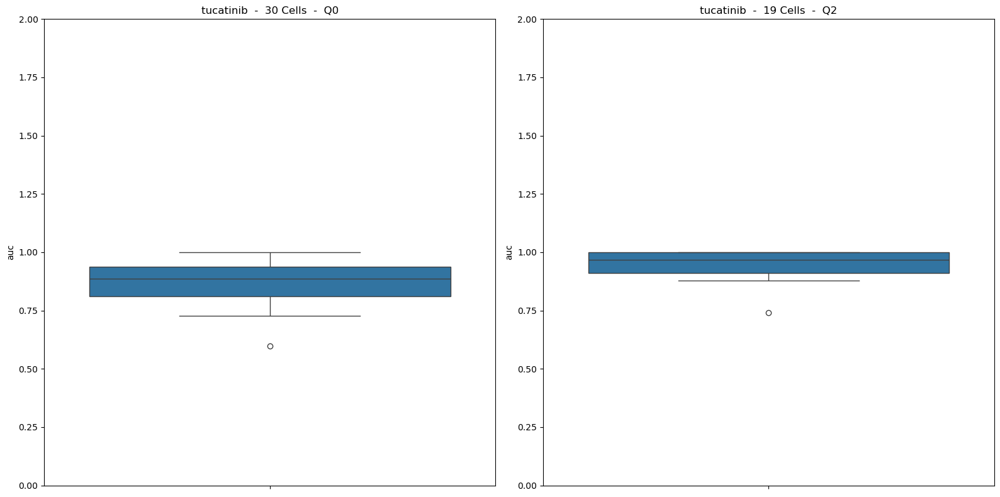

...

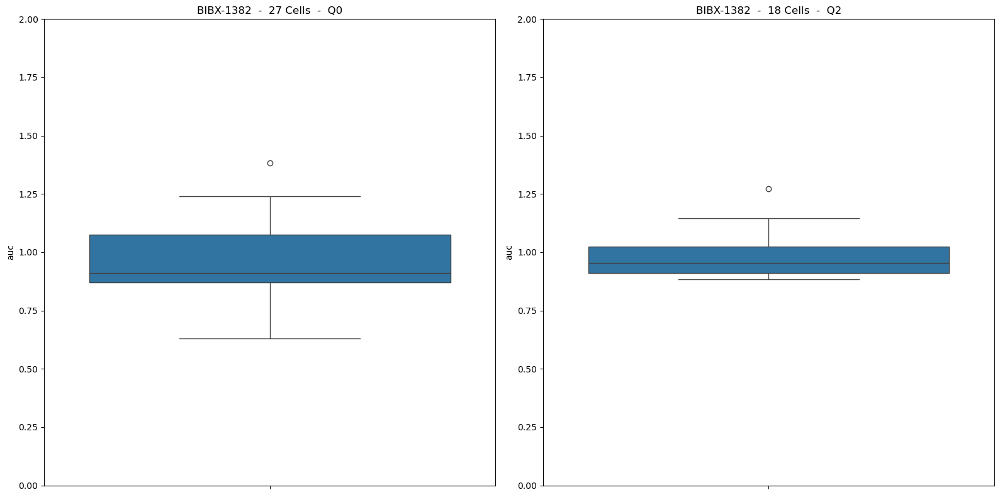

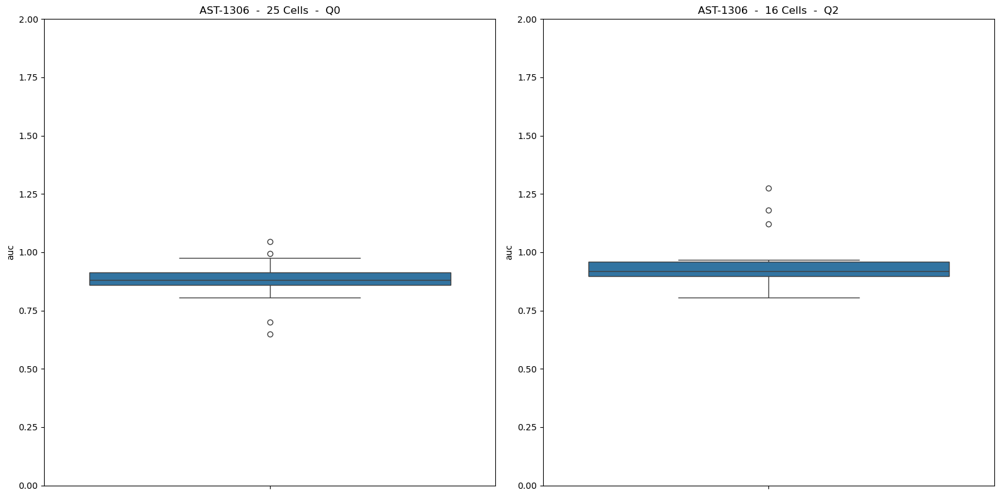

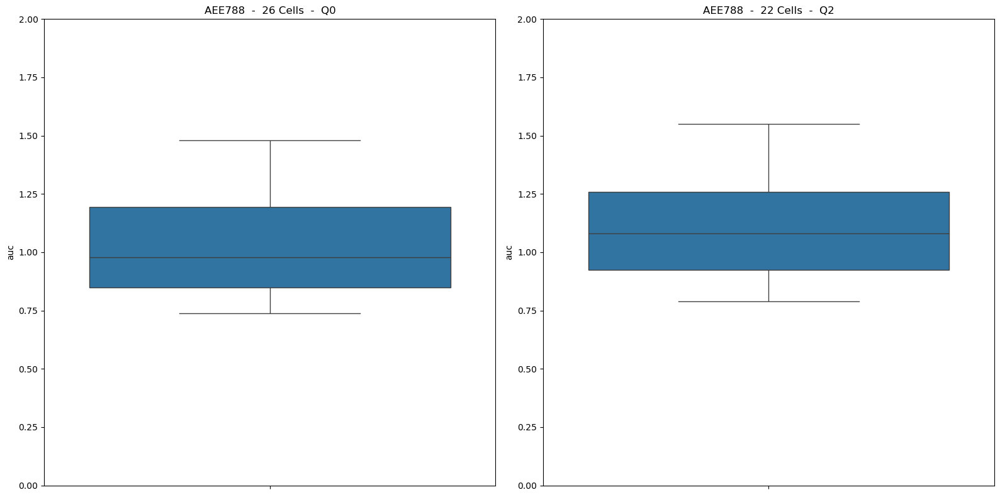

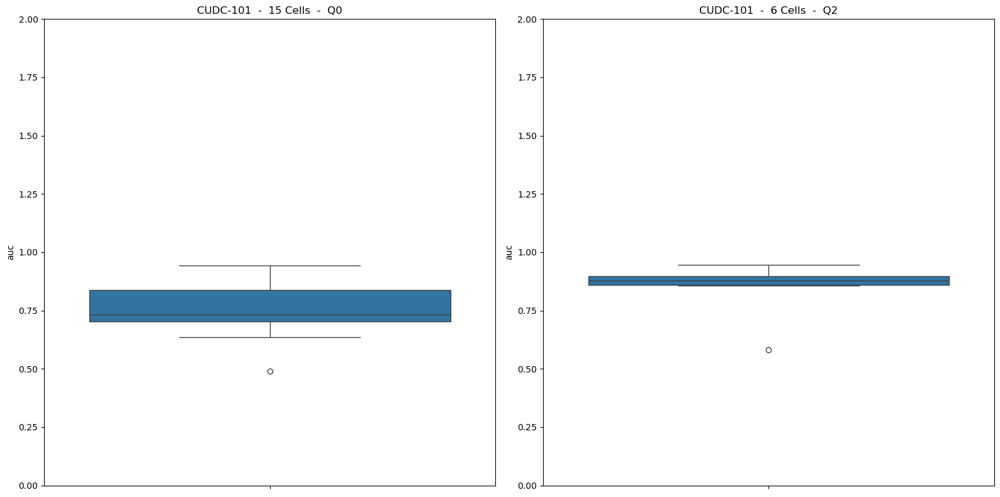

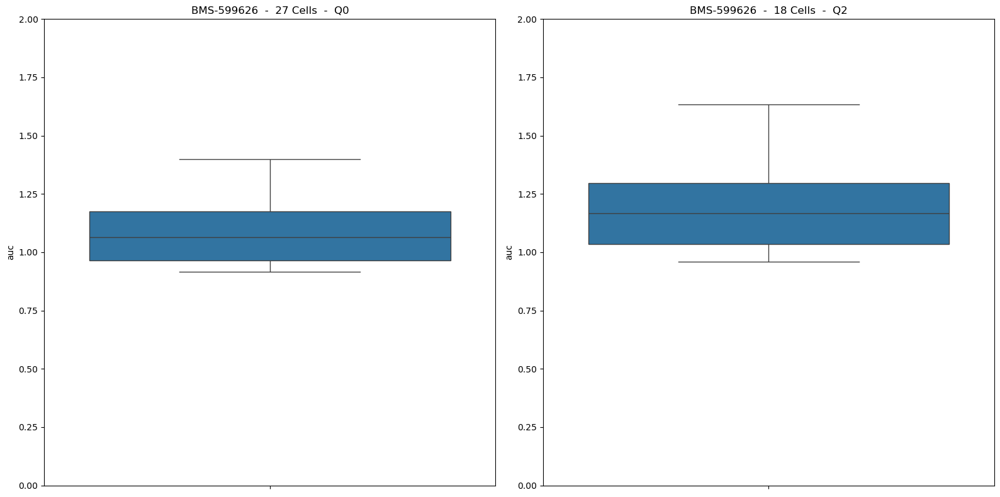

In [117]:
df_filtered_by_type = df_outputs_filtered[df_outputs_filtered['depmap_id'].isin(cell_lines)]

for drug in drug_net['name'][drug_net['moa']==moa].unique():
    try:
        sub = df_filtered_by_type[df_filtered_by_type['name'] == drug]
        sub = sub.copy()
        
        df_sub_tf = df_tf.copy()
        df_sub_tf['cuartil'] = pd.qcut(df_sub_tf[tf_of_interest], number_quartiles, labels=False)
   
        
        cells_1 = df_sub_tf[df_sub_tf['cuartil'] == 0]
        cells_2 = df_sub_tf[df_sub_tf['cuartil'] == (number_quartiles-1)]
        auc_1 = sub['auc'][sub['depmap_id'].isin(cells_1.index)]
        auc_2 = sub['auc'][sub['depmap_id'].isin(cells_2.index)]

        fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
        sns.boxplot(data=auc_1, ax=axes[0])
        axes[0].set_ylim(0, 2)
        axes[0].set_title(f'{drug}  -  {len(auc_1)} Cells  -  Q0')

        # Boxplot para el segundo grupo (cells_2)
        sns.boxplot(data=auc_2, ax=axes[1])
        axes[1].set_ylim(0, 2)
        axes[1].set_title(f'{drug}  -  {len(auc_2)} Cells  -  Q{(number_quartiles-1)}')

        # Ajustar la figura para que no haya superposición
        plt.tight_layout()

        # Mostrar el gráfico
        plt.show()
            
    except Exception:
        continue